In [24]:
import cv2
import imutils

from src import config, image_utils, objects_detector
from src.aruco_marker import ArucoMarker
from src.route_generator import RouteGenerator
from src.model.climber import Climber
from src.model.point import Point
from src.model.color import Color

## Load image

In [2]:
img = cv2.imread('./../datasets/images/test/34.jpeg')
img = imutils.resize(img, width=1216)

## Load Aruco markers

In [3]:
marker = ArucoMarker(config.MARKER_ARUCO_DICT, img, config.MARKER_PERIMETER_IN_CM)

In [4]:
print("ArUco Perimeter: {}".format(marker.get_perimeter()))
print("Pixels per centimeter: {}".format(marker.get_pixels_per_centimeter()))

print("Width in px: {}".format(marker.get_width()))
print("Width in cm: {}".format(marker.get_width_in_cm()))
print("Height in px: {}".format(marker.get_height()))
print("Height in cm: {}".format(marker.get_height_in_cm()))

ArUco Perimeter: 149.73137283325195
Pixels per centimeter: 5.347549029758999
Width in px: 37.33630940518894
Width in cm: 6.981948028416974
Height in px: 37.05401462729781
Height in cm: 6.929158465138514


## Detect objects

In [5]:
detected_objects = objects_detector.detect(img)


0: 1216x928 82 holds, 1988.9ms
Speed: 7.6ms preprocess, 1988.9ms inference, 1.5ms postprocess per image at shape (1, 3, 1216, 928)


# Draw bounding boxes

In [6]:
img = image_utils.draw_bboxes(
    img,
    detected_objects,
    config.BBOX_COLOR,
    config.BBOX_CENTER_COLOR,
    config.LINE_WIDTH,
    override=False
)

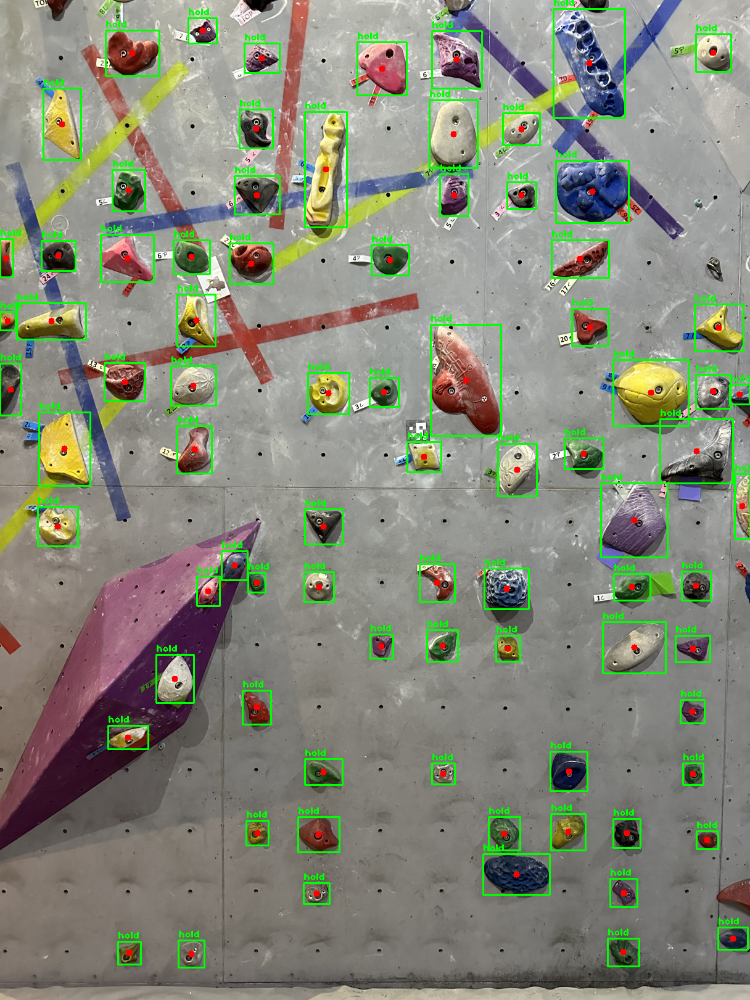

In [7]:
image_utils.display_image(img)

# Find climber starting position

In [8]:
climber_starting_point = RouteGenerator(
    img_width=img.shape[1], 
    img_height=img.shape[0], 
    marker=marker, 
    detected_objects=detected_objects
)

In [9]:
climber = climber_starting_point.prepare_first_step(
    climber_height_in_cm=config.CLIMBER_HEIGHT_IN_CM,
    starting_steps_max_distance_from_ground_in_cm=40
)

In [10]:
img = image_utils.draw_climber(
    img=img,
    climber=climber
)

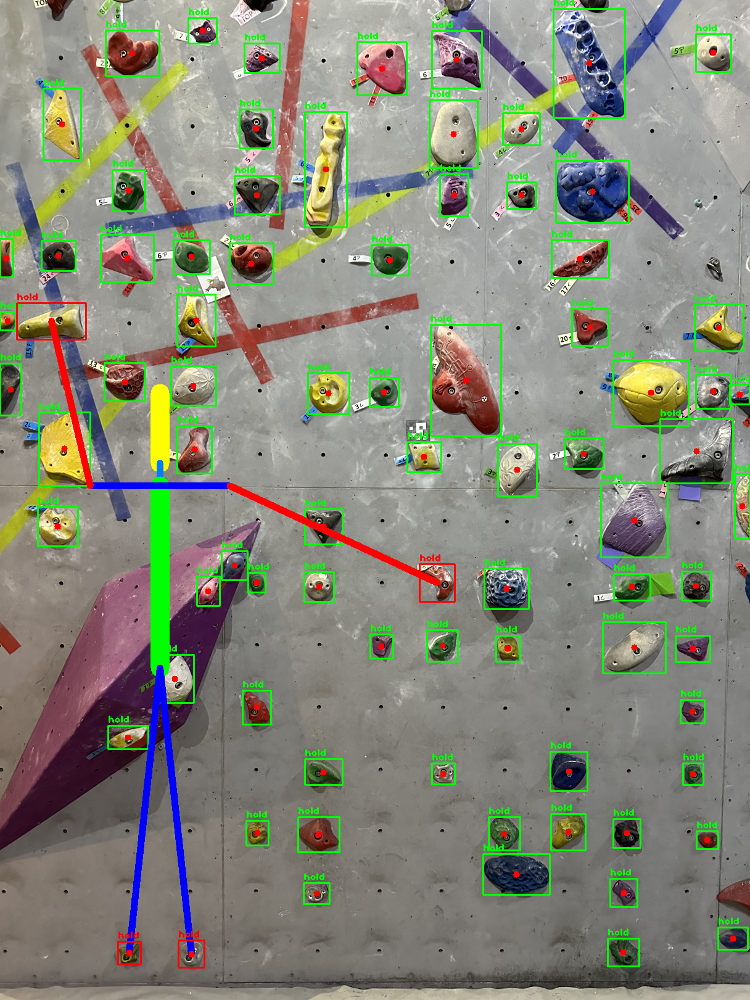

In [11]:
image_utils.display_image(img)

# Second step

In [12]:
climber_new_position = climber_starting_point.prepare_next_step(
    climber=climber,
)

In [13]:
img = image_utils.draw_climber(
    img=img,
    climber=climber_new_position
)

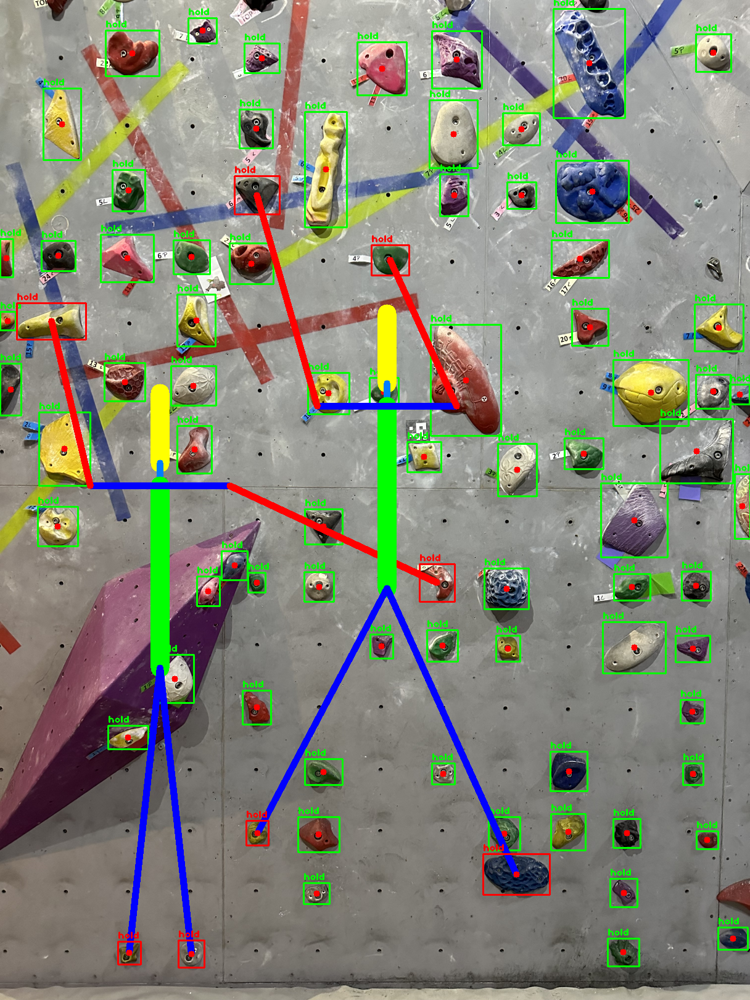

In [14]:
image_utils.display_image(img)

In [16]:
climber_new_position_2 = climber_starting_point.prepare_next_step(
    climber=climber_new_position,
)

In [19]:
img = image_utils.draw_climber(
    img=img,
    climber=climber_new_position_2
)

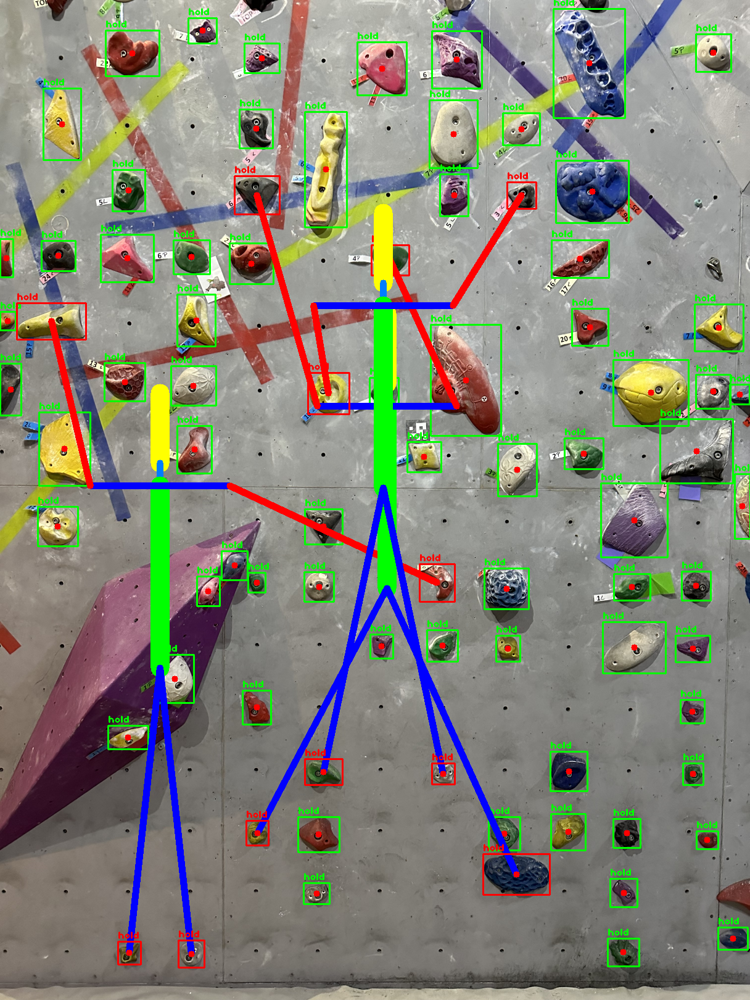

In [20]:
image_utils.display_image(img)

In [30]:
point_above_head = Point(
    x=climber_new_position_2.head.start.x,
    y=int(climber_new_position_2.head.start.y - climber.body_proportion.head)
)

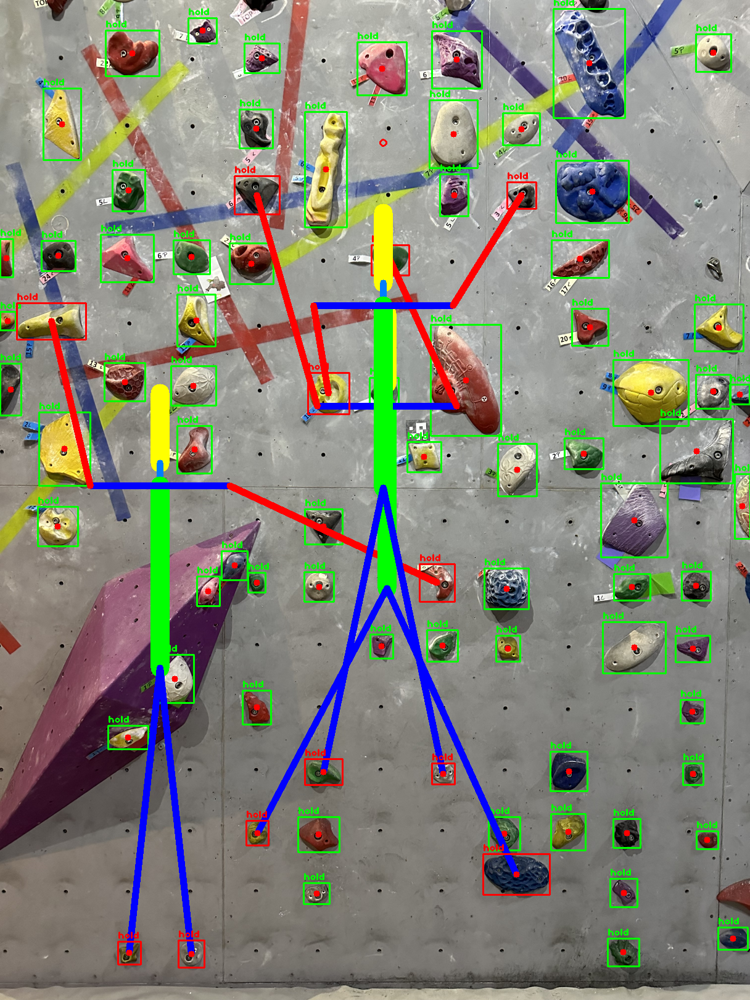

In [31]:
img_tmp = image_utils.draw_circle_around_point(
    img=img,
    point=point_above_head,
    radius=5,
    circle_color=Color.red(),
    line_width=2,
    override=False
)

image_utils.display_image(img_tmp)

In [ ]:
# def is_climber_on_top(climber: Climber) -> bool:
#     return climber.head.start